# 概要論文

## 手法 methodology(手法と実験方法)
### 手法
- deeplabv3+
- data augmentation
    - mixup
    - others
- loss function
    - focal loss
    - focal tversky loss
    - boundary loss
- アンサンブル学習

### 実験方法
- epoch
- batchsize

## 結果 results
- 各データセット(easy, middle, hard)の結果
- (初期実装unet)との比較

## discuss

## conclusion


# 推定結果をいろいろする

- 複数のモデルの推定結果を混ぜる

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')
%cd "~/data/JSCASAIChallenge/jscas_ai_challenge_2020_data/"

/home/jovyan/data/JSCASAIChallenge/jscas_ai_challenge_2020_data


In [2]:
# -*- coding: utf-8 -*-
"""
Sample segmentation program for challenge in JSCAS 2020
@author: Masahiro Oda (Nagoya Univ.)

Some functions are obtained from the Deep learning sample code collection for MEDical image processing: DMED
DMED is proposed in:
小田昌宏，原武史，森健策，``医用画像処理のための深層学習サンプルコード集DMED,'' 日本コンピュータ外科学会誌 第27回日本コンピュータ外科学会大会特集号（JSCAS2018）, 2018

U-Net was proposed by:
Olaf Ronneberger, Philipp Fischer, Thomas Brox. U-Net: Convolutional Networks for Biomedical Image Segmentation, MICCAI 2015, 9351, pp.234-241, 2015.
"""



import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#from sklearn.model_selection import train_test_split

# tensorflow1系+kerasは以下を使用
# from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization
# from keras.layers.merge import concatenate
# from keras.models import Model
# from keras.utils.np_utils import to_categorical

# tensorflow2系は以下を使用
import tensorflow as tf
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization
from tensorflow.keras.layers import concatenate
from tensorflow.keras.utils import to_categorical

# GPUの設定
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.set_visible_devices(physical_devices[9:], 'GPU')

# %% パラメータ定義
imagesize_original = (1280, 720)  # 画像のサイズ
imagesize_process = (int(1280/4), int(720/4)-4)  # モデルによる処理時の画像サイズ

task_level = 1  # challengeの課題レベル．1または2を指定

class_num = 1  # セグメンテーション対象クラス数
if task_level == 2:
    class_num = 2



# ディレクトリ内の画像を読み込む
# inputpath: ディレクトリのパス, imagesize: 画像サイズ, type_color: ColorかGray
def load_images(inputpath, imagesize, type_color):
    imglist = []

    for root, dirs, files in os.walk(inputpath):
        for fn in sorted(files):
            bn, ext = os.path.splitext(fn)
            if ext not in [".bmp", ".BMP", ".jpg", ".JPG", ".jpeg", ".JPEG", ".png", ".PNG"]:
                continue
            if 'checkpoint' in fn:
                continue
            filename = os.path.join(root, fn)

            if type_color == 'Color':
                # カラー画像の場合
                testimage = cv2.imread(filename, cv2.IMREAD_COLOR)
                # サイズ変更
                height, width = testimage.shape[:2]
                # 主に縮小するのでINTER_AREA使用
                testimage = cv2.resize(
                    testimage, imagesize, interpolation=cv2.INTER_AREA)
                testimage = np.asarray(testimage, dtype=np.float32)
                # 色チャンネル，高さ，幅に入れ替え．data_format="channels_first"を使うとき必要
                #testimage = testimage.transpose(2, 0, 1)
                # チャンネルをbgrからrgbの順に変更
                testimage = testimage[:, :, ::-1]

            elif type_color == 'Gray':
                # グレースケール画像の場合
                testimage = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
                # サイズ変更
                height, width = testimage.shape[:2]
                # 主に縮小するのでINTER_AREA使用
                testimage = cv2.resize(
                    testimage, imagesize, interpolation=cv2.INTER_AREA)
                # チャンネルの次元がないので1次元追加する
                testimage = np.asarray(testimage, dtype=np.float32).reshape(
                    (imagesize[1], imagesize[0], 1))
                # チャンネル，高さ，幅に入れ替え．data_format="channels_first"を使うとき必要
                #testimage = testimage.transpose(2, 0, 1)

            imglist.append(testimage)
    imgsdata = np.asarray(imglist, dtype=np.float32)

    return imgsdata, sorted(files)  # 画像リストとファイル名のリストを返す



# 指定ディレクトリに画像リストの画像を保存する
# savepath: ディレクトリ文字列, filenamelist: ファイル名リスト, imagelist: 画像リスト, imagesize: 保存する画像サイズ
def save_images(savepath, filenamelist, imagelist, imagesize):
    for i, fn in enumerate(filenamelist):
        filename = os.path.join(savepath, fn)
        testimage = imagelist[i]
        # チャンネルをrgbからbgrの順に変更
        if testimage.ndim == 3:
            testimage = testimage[:, :, ::-1]
        # サイズ変更
        testimage = np.array(testimage, dtype='uint8')
        testimage = cv2.resize(testimage, imagesize,
                               interpolation=cv2.INTER_CUBIC)
        cv2.imwrite(filename, testimage)

# label画像リストをone hot vector形式にする．label値のない画素は無視
# imglist: (datanum, width, height, channel=1)のベクトルと仮定


def image_to_onehot(imglist, num_classes):
    num_data, width, height, channel = imglist.shape

    #imglist = np.asarray(imglist, dtype=np.int16)
    imglist = imglist.reshape(num_data*width*height)  # change to 1D vector
    # delete numbers larger than class number
    imglist = np.where((imglist > num_classes), 0, imglist)
    # class number includes background class
    imglist = to_categorical(imglist, num_classes=num_classes+1)
    imglist = imglist[:, 1:]  # delete imglist[:, 0]
    imglist = imglist.reshape(num_data, width, height,
                              num_classes)  # reshape to 3D vector

    return imglist

In [3]:
# %% データ読み込み
# csvファイルを開く
df_source = pd.read_csv('./datadirectory.csv')

# 特定のヘッダを持つ列だけ取り出す
df_train_image_dir = df_source['image_directory_train']
df_train_label_dir = df_source['label_directory_train']

df_test_image_dir = df_source['image_directory_test']
df_test_label_dir = df_source['label_directory_test']


# データ準備
# training用画像読み込み
train_image_org = np.empty(0)
train_label_org = np.empty(0)
for i in range(df_train_image_dir.count()):
    train_image_temp, train_image_filenames_temp = load_images(
        df_train_image_dir.iat[i], imagesize_process, 'Color')
    train_label_temp, train_label_filenames_temp = load_images(
        df_train_label_dir.iat[i], imagesize_process, 'Gray')
    if len(train_image_org) == 0:
        train_image_org = train_image_temp
        train_label_org = train_label_temp
    else:
        train_image_org = np.concatenate([train_image_org, train_image_temp], axis=0)
        train_label_org = np.concatenate([train_label_org, train_label_temp], axis=0)


# test用画像読み込み
test_image_org = np.empty(0)
test_label_org = np.empty(0)
test_filenames_org = []  # 結果書き出し用にファイル名リストを格納する
for i in range(df_test_image_dir.count()):
    test_image_temp, test_image_filenames_temp = load_images(
        df_test_image_dir.iat[i], imagesize_process, 'Color')
    test_label_temp, test_label_filenames_temp = load_images(
        df_test_label_dir.iat[i], imagesize_process, 'Gray')
    test_filenames_org.append(test_image_filenames_temp)
    if len(test_image_org) == 0:
        test_image_org = test_image_temp
        test_label_org = test_label_temp
    else:
        test_image_org = np.concatenate([test_image_org, test_image_temp], axis=0)
        test_label_org = np.concatenate([test_label_org, test_label_temp], axis=0)

test_filenames_org = np.asarray(test_filenames_org, dtype=object)
test_filenames_org = test_filenames_org.reshape(-1)

print('Data load finished')
print('Data numbers for train: ' + repr(len(train_image_org)) +
      ', test: ' + repr(len(test_image_org)))


# train_image, test_image, train_label, test_label = train_test_split(all_image, all_label, test_size=0.2)#1つのデータセットをtrainとtest用に分割する場合




Data load finished
Data numbers for train: 325, test: 75


In [4]:

# %% データ前処理

# 画像枚数
train_data_size = len(train_image_org)
train_image = train_image_org[:train_data_size]
train_label = train_label_org[:train_data_size]


test_data_size = len(test_image_org)
test_image = test_image_org[:test_data_size]
test_label = test_label_org[:test_data_size]
test_filenames = test_filenames_org[:test_data_size]

# 画像の画素値0-1正規化
train_image /= np.max(train_image)
test_image /= np.max(test_image)
print(len(train_image))

325


Loaded image samples


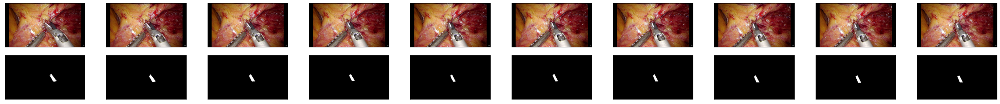

In [5]:
# 課題レベル1では以下2行を使用．全label値を1に変更
if task_level == 1:
    train_label = np.where(train_label > 0, 1, 0)
    test_label = np.where(test_label > 0, 1, 0)

# label画像をone hot vector形式にする
train_label = image_to_onehot(train_label, class_num)
test_label = image_to_onehot(test_label, class_num)


# training用の原画像とlabel画像表示
print('Loaded image samples')
n = 10
plt.figure(figsize=(40, 4))
for i in range(n):
    # 原画像
    ax = plt.subplot(2, n, i+1)
    plt.imshow(train_image[i].reshape(
        imagesize_process[1], imagesize_process[0], 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # label画像（label値が1の部分だけ表示）
    ax = plt.subplot(2, n, i+1+n)
    plt.imshow(train_label[i, :, :, 0].reshape(
        imagesize_process[1], imagesize_process[0]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# Load test data

In [6]:
def load_test_images(dirname):
  # %% パラメータ定義
    dirs = os.listdir('./testdata')

    # とりあえずACEだけ使う
    filenames = []
    for i in dirs:
        if i == dirname:
            images, image_filenames_temp = load_images(
                  os.path.join('testdata', i, 'movieframe'), imagesize_process, 'Color')
            labels, label_filenames_temp = load_images(
                  os.path.join('testdata', i, 'label'), imagesize_process, 'Gray')
            filenames.append(image_filenames_temp)
    print(len(images), len(labels), len(image_filenames_temp))
    filenames = np.asarray(filenames, dtype=object)
    filenames = filenames.reshape(-1)

    # 画像の画素値0-1正規化
    images /=np.max(images)


    class_num = 1  # セグメンテーション対象クラス数
    if task_level == 2:
        class_num = 2


  # 課題レベル1では以下2行を使用．全label値を1に変更
    if task_level == 1:
        labels = np.where(labels > 0, 1, 0)

    # label画像をone hot vector形式にする
    labels = image_to_onehot(labels, class_num)
    return (images, labels, filenames)

In [7]:
# 試験用画像でモデルの精度を確かめる
def check(images, labels, filenames):
  results = model.predict(images, verbose=1)
  results_label0 = results[:, :, :, 0]  # label値1のセグメンテーション結果取り出し
  if task_level == 2:
      results_label1 = results[:, :, :, 1]  # label値2のセグメンテーション結果取り出し

  # test画像からの推定結果の画像表示
  print('Estimation results')
  n = min(20, len(results))
  plt.figure(figsize=(40, 6))
  for i in range(n):
      # 原画像
      ax = plt.subplot(3, n, i+1)
      plt.imshow(images[i].reshape(
          imagesize_process[1], imagesize_process[0], 3))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      # 推定label画像（label値が1の部分だけ表示）
      ax = plt.subplot(3, n, i+1+n)
      plt.imshow(results_label0[i].reshape(
          imagesize_process[1], imagesize_process[0]))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      # groundtruth
      ax = plt.subplot(3, n, i+1+n*2)
      plt.imshow(labels[i].reshape(
          imagesize_process[1], imagesize_process[0]))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
  plt.show()


  # %% 後処理とファイル保存
  # 推定結果をファイル保存

  # 推定結果をしきい値処理して2値画像にする
  results_binary_label0 = np.where(results_label0 > 0.5, 1, 0)
  if task_level == 2:
      results_binary_label1 = np.where(results_label1 > 0.5, 1, 0)
  # 推定結果を1枚の画像に統合する
  print(results_binary_label0.shape)
  results_binary = np.empty_like(results_binary_label0)
  results_binary[results_binary_label0 == 1] = 1
  results_binary[results_binary_label0 == 0] = 0
  if task_level == 2:
      results_binary[results_binary_label1 == 1] = 2
  
  # label値1についての評価結果
  print('Label 1:')
  evaluate(results_binary_label0, labels[:, :, :, 0])

  # label値2についての評価結果
  if task_level == 2:
      print('Label 2:')
      evaluate(results_binary_label1, labels[:, :, :, 1])


#   # label画像保存
#   save_images('./test_result/result_label/', filenames,
#               results_binary, imagesize_original)

  # labelを元画像に重畳したblend画像保存
  results_blend = images.copy() * 255.0
  results_blend = np.where(np.expand_dims(results_binary_label0, -1) ==
                          1, [0.0, 255.0, 255.0], results_blend)  # 推定値がしきい値以上ならlabel値1に対応した色で塗る
  if task_level == 2:
      results_blend = np.where(np.expand_dims(results_binary_label1, -1) ==
                              1, [255.0, 255.0, 0.0], results_blend)  # 推定値がしきい値以上ならlabel値2に対応した色で塗る
#   save_images('./test_result/result_blend/', filenames,
#               results_blend, imagesize_original)

In [8]:
check_data_dirs = ['JASCAS_ACE_easy', 'JASCAS_ACE_middle', 'JASCAS_ACE_hard','JASCAS_HD_easy', 'JASCAS_HD_middle', 'JASCAS_HD_hard']
# check_image, check_label, check_filename = load_test_images(directorys[0])

# check(i,l,f)

# evaluate

In [9]:
# %% 推定結果の評価
# 推定結果と成果の画像集合から評価値を求めて表示する関数
def evaluate(estimated, groundtruth):
    if estimated.shape != groundtruth.shape:
        print('Shapes of estimated and groundtruth must be same')
        return

    tp = np.count_nonzero((estimated == 1) & (groundtruth == 1))
    fp = np.count_nonzero((estimated == 1) & (groundtruth == 0))
    fn = np.count_nonzero((estimated == 0) & (groundtruth == 1))
    gt = np.count_nonzero(groundtruth == 1)
    pr = np.count_nonzero(estimated == 1)

    precision = 0.0
    if tp > 0 or fp > 0:
        precision = tp / float(tp + fp)

    recall = 0.0
    if tp > 0 or fn > 0:
        recall = tp / float(tp + fn)

    fmeasure = 0
    if precision > 0.0 or recall > 0.0:
        fmeasure = (2.0 * precision * recall) / (precision + recall)

    # mIoU = 0.0
    # if gt+pr-tp > 0
    # mIoU = tp / float(gt+pr-tp)


    # TP,FP,FNの画素数，Precision,Recall,F-measureの値を表示
    print('TP:%d, FP:%d, FN:%d, Precision:%f, Recall:%f, F-measure:%f' %
          (tp, fp, fn, precision, recall, fmeasure))
    return (tp, fp, fn, precision, recall, fmeasure)


In [10]:
# 学習済みモデル読み込み
from keras.models import model_from_json
def load_model(model_filename, weight_filename):
    with open(model_filename, mode='r') as f:
        s = f.read()
        model = model_from_json(s, custom_objects={'tf': tf})  
        model.load_weights(weight_filename)
        return model

In [11]:
# %% 推定
# test画像を用いた推定の実行
def show_predict_results(results, test_label, test_image, dirname=None, filenames=None, threshold=0.5):

    results_label0 = results[:, :, :, 0]  # label値1のセグメンテーション結果取り出し
    if task_level == 2:
        results_label1 = results[:, :, :, 1]  # label値2のセグメンテーション結果取り出し
    
    print(np.max(results_label0))

    # test画像からの推定結果の画像表示
    print('Estimation results')
    n = min(20, len(results))
    plt.figure(figsize=(40, 6))
    for i in range(n):
        # 原画像
        ax = plt.subplot(3, n, i+1)
        plt.imshow(test_image[i].reshape(
            imagesize_process[1], imagesize_process[0], 3))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # 推定label画像（label値が1の部分だけ表示）
        ax = plt.subplot(3, n, i+1+n)
        plt.imshow(results_label0[i].reshape(
            imagesize_process[1], imagesize_process[0]))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # groundtruth
        ax = plt.subplot(3, n, i+1+n*2)
        plt.imshow(test_label[i].reshape(
            imagesize_process[1], imagesize_process[0]))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()


    # %% 後処理とファイル保存
    # 推定結果をファイル保存

    # 推定結果をしきい値処理して2値画像にする
    results_binary_label0 = np.where(results_label0 > threshold, 1, 0)
    if task_level == 2:
        results_binary_label1 = np.where(results_label1 > threshold, 1, 0)
    # 推定結果を1枚の画像に統合する
    print(results_binary_label0.shape)
    results_binary = np.empty_like(results_binary_label0)
    results_binary[results_binary_label0 == 1] = 1
    results_binary[results_binary_label0 == 0] = 0
    if task_level == 2:
        results_binary[results_binary_label1 == 1] = 2


    # label値1についての評価結果
    print('Label 1:')
    e = evaluate(results_binary_label0, test_label[:, :, :, 0])

    # label値2についての評価結果
    if task_level == 2:
        print('Label 2:')
        e = evaluate(results_binary_label1, test_label[:, :, :, 1])
    
    # # labelを元画像に重畳したblend画像保存
    results_blend = test_image.copy() * 255.0
    results_blend = np.where(np.expand_dims(results_binary_label0, -1) ==
                             1, [0.0, 255.0, 255.0], results_blend)  # 推定値がしきい値以上ならlabel値1に対応した色で塗る

    if dirname is not None:
        # # label画像保存
        save_images(os.path.join('./testresult', dirname, 'label'), filenames,
                    results_binary, imagesize_original)

          # if task_level == 2:
        #     results_blend = np.where(np.expand_dims(results_binary_label1, -1) ==
        #                              1, [255.0, 255.0, 0.0], results_blend)  # 推定値がしきい値以上ならlabel値2に対応した色で塗る
        save_images(os.path.join('./testresult', dirname, 'blend'), filenames,
                    results_blend, imagesize_original)
    return e






# アンサンブル学習

In [12]:
# model = load_model('./segmentation_model_deeplabv3_19.json','./segmentation_weight_deeplabv3_19.hdf5' )
# model2 = load_model('./segmentation_model_deeplabv3_15.json','./segmentation_weight_deeplabv3_15.hdf5' )
# model3 = load_model('./segmentation_model_deeplabv3_13.json','./segmentation_weight_deeplabv3_13.hdf5' )
# r1 = model.predict(test_image, verbose=1)
# r2 = model2.predict(test_image, verbose=1)
# r3 = model3.predict(test_image, verbose=1)


In [13]:
def ensemble(models, weights, test_image):
    if len(models) != len(weights):
        print('different length between models and weights')
        return
    results = []
    for m in models:
        results.append(m.predict(test_image, verbose=0))
    return np.sum(np.array(weights)*np.array(results), axis=0)

def ensemble_max(models, test_image):
    results = []
    for m in models:
        results.append(m.predict(test_image, verbose=0))
    return np.max(np.array(results), axis=0)
    

In [14]:
# show_predict_results(r1)
# show_predict_results(r2)
# show_predict_results(r3)
# w1 = 0.6
# r = w1*r1+(1.0-w1)*r2
# r = (r1+r2+r3)/3.0
# show_predict_results(r)


# チェック用データ検証

25 25 25
1.0
Estimation results


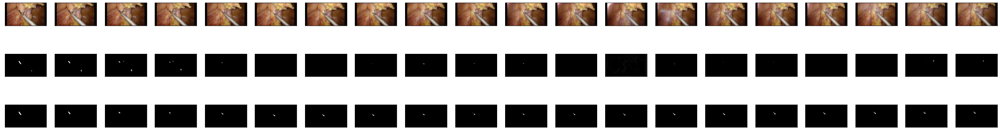

(25, 176, 320)
Label 1:
TP:749, FP:404, FN:1552, Precision:0.649610, Recall:0.325511, F-measure:0.433700
25 25 25
1.0
Estimation results


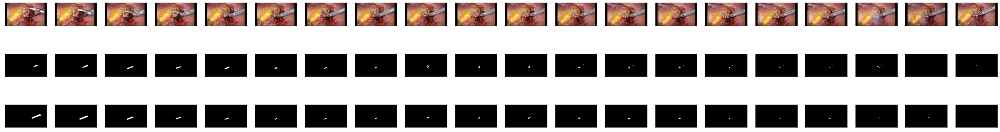

(25, 176, 320)
Label 1:
TP:2946, FP:1043, FN:1702, Precision:0.738531, Recall:0.633821, F-measure:0.682181
25 25 25
5.200632e-06
Estimation results


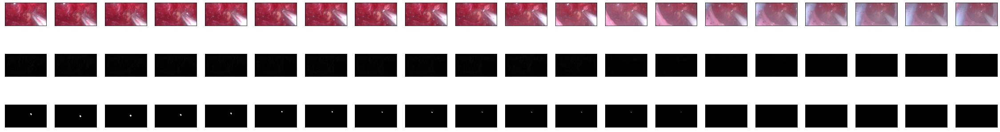

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
25 25 25
1.0
Estimation results


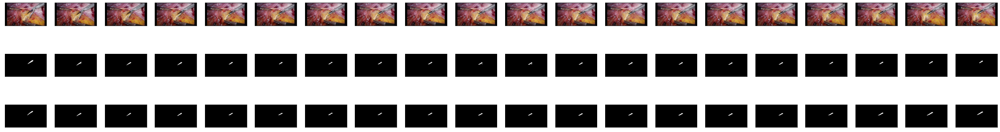

(25, 176, 320)
Label 1:
TP:4399, FP:367, FN:2658, Precision:0.922996, Recall:0.623353, F-measure:0.744143
25 25 25
1.0
Estimation results


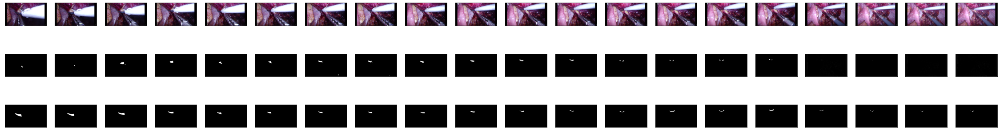

(25, 176, 320)
Label 1:
TP:2035, FP:954, FN:2609, Precision:0.680830, Recall:0.438200, F-measure:0.533211
25 25 25
4.316795e-06
Estimation results


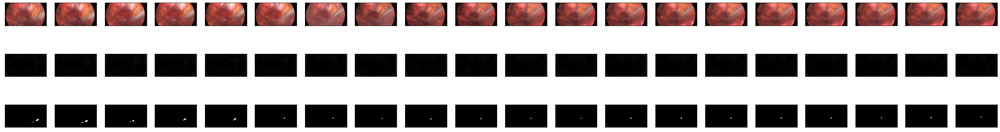

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000


In [17]:
no = '49'
    
model5 = load_model(f'./segmentation_model_deeplabv3_{no}.json',
                    f'./segmentation_weight_deeplabv3_{no}.hdf5')
for d in check_data_dirs:
    i, l, f = load_test_images(d)
    r = model5.predict(i)
    show_predict_results(r, l, i)
        

25 25 25
Estimation results


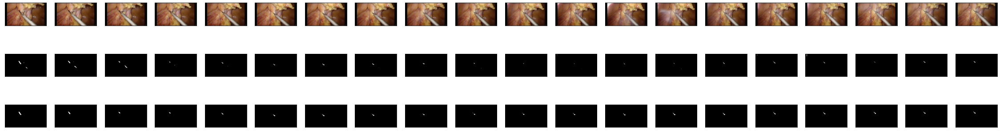

(25, 176, 320)
Label 1:
TP:1433, FP:457, FN:868, Precision:0.758201, Recall:0.622773, F-measure:0.683846
Estimation results


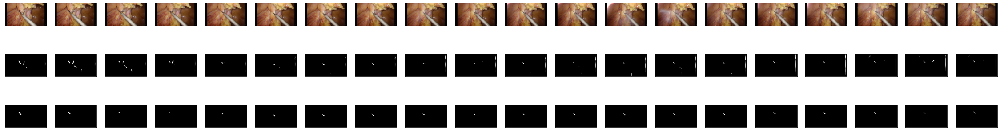

(25, 176, 320)
Label 1:
TP:1597, FP:7261, FN:704, Precision:0.180289, Recall:0.694046, F-measure:0.286226
Estimation results


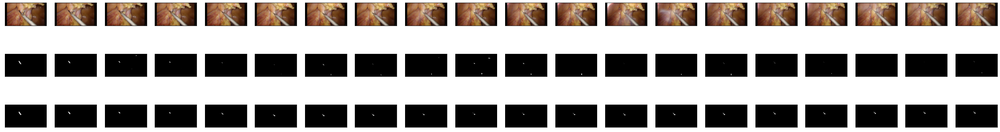

(25, 176, 320)
Label 1:
TP:815, FP:479, FN:1486, Precision:0.629830, Recall:0.354194, F-measure:0.453408
Estimation results


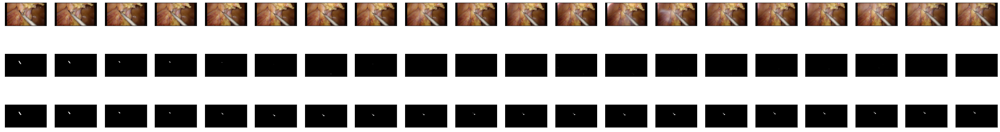

(25, 176, 320)
Label 1:
TP:666, FP:70, FN:1635, Precision:0.904891, Recall:0.289439, F-measure:0.438591
Estimation results


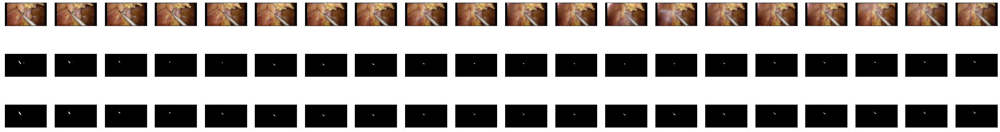

(25, 176, 320)
Label 1:
TP:1743, FP:186, FN:558, Precision:0.903577, Recall:0.757497, F-measure:0.824113
Estimation results


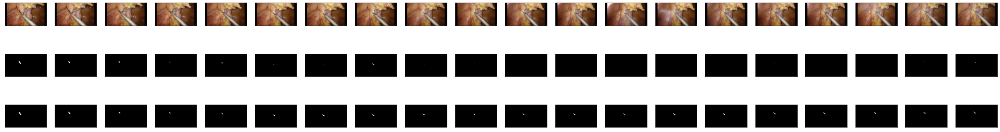

(25, 176, 320)
Label 1:
TP:930, FP:53, FN:1371, Precision:0.946083, Recall:0.404172, F-measure:0.566382
25 25 25
Estimation results


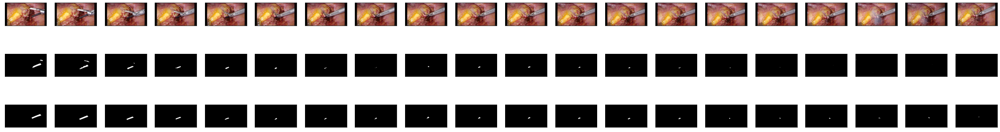

(25, 176, 320)
Label 1:
TP:3239, FP:831, FN:1409, Precision:0.795823, Recall:0.696859, F-measure:0.743060
Estimation results


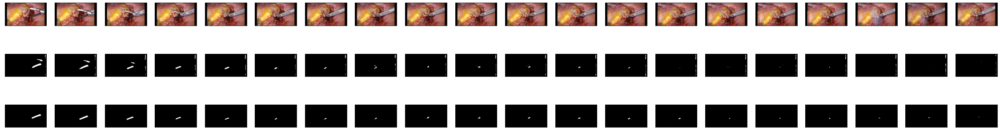

(25, 176, 320)
Label 1:
TP:3675, FP:6304, FN:973, Precision:0.368273, Recall:0.790663, F-measure:0.502495
Estimation results


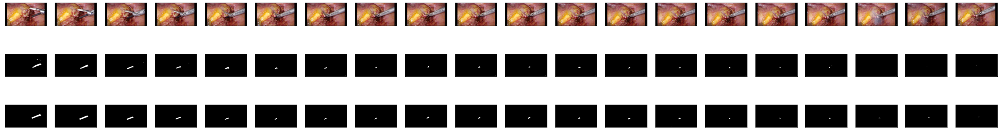

(25, 176, 320)
Label 1:
TP:3264, FP:745, FN:1384, Precision:0.814168, Recall:0.702238, F-measure:0.754072
Estimation results


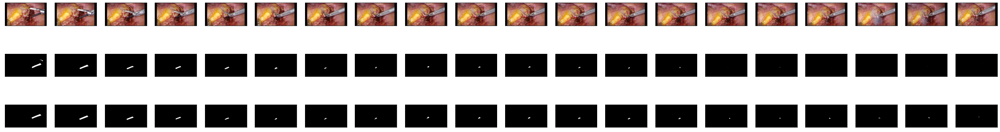

(25, 176, 320)
Label 1:
TP:3610, FP:584, FN:1038, Precision:0.860753, Recall:0.776678, F-measure:0.816557
Estimation results


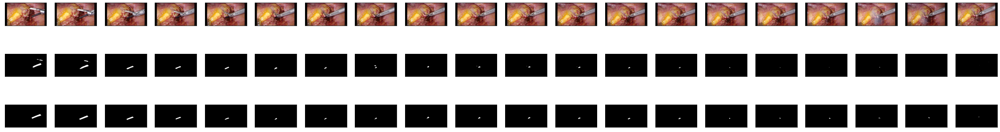

(25, 176, 320)
Label 1:
TP:3661, FP:1066, FN:987, Precision:0.774487, Recall:0.787651, F-measure:0.781013
Estimation results


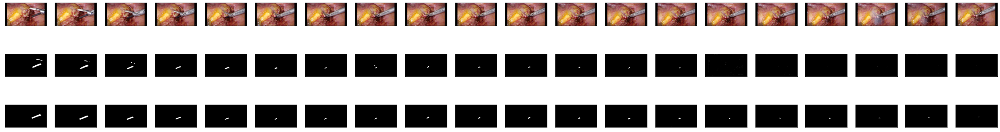

(25, 176, 320)
Label 1:
TP:3219, FP:1076, FN:1429, Precision:0.749476, Recall:0.692556, F-measure:0.719893
25 25 25
Estimation results


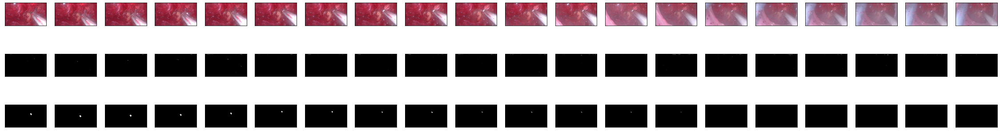

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


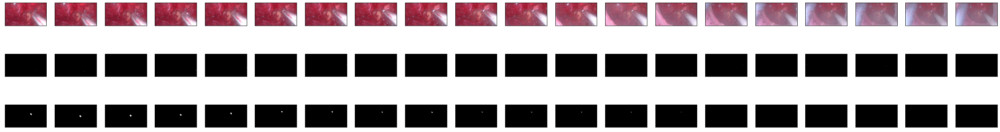

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


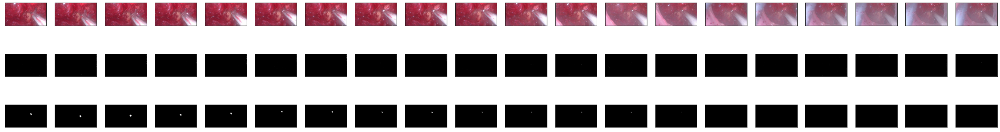

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


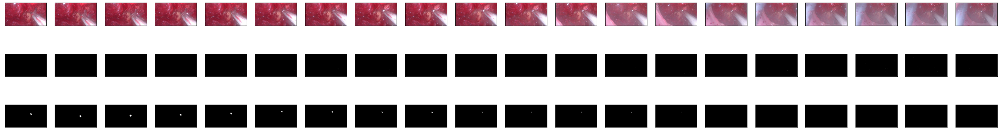

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


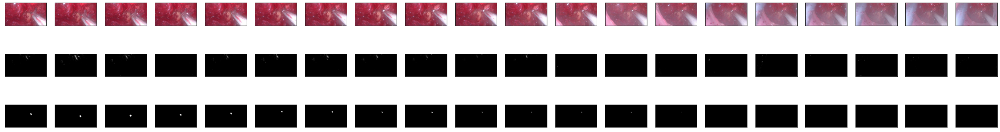

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


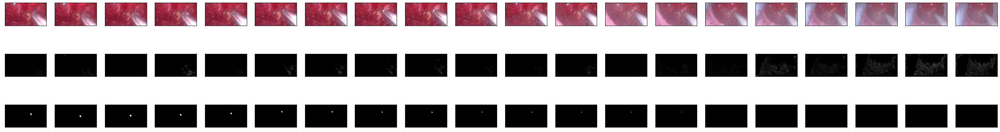

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
25 25 25
Estimation results


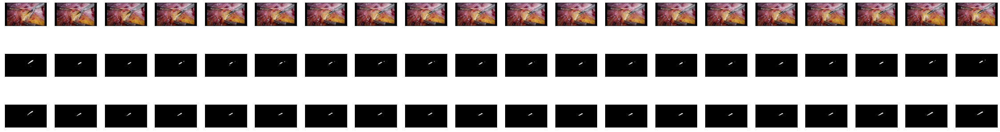

(25, 176, 320)
Label 1:
TP:5010, FP:848, FN:2047, Precision:0.855241, Recall:0.709933, F-measure:0.775842
Estimation results


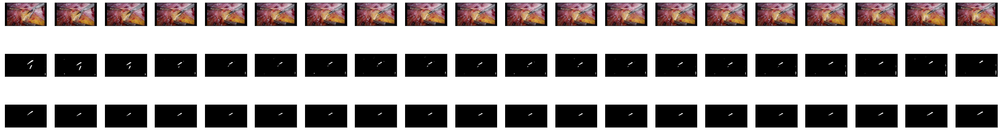

(25, 176, 320)
Label 1:
TP:5555, FP:4850, FN:1502, Precision:0.533878, Recall:0.787162, F-measure:0.636239
Estimation results


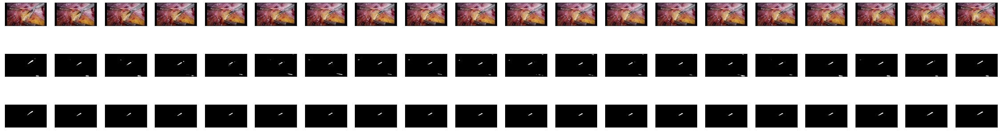

(25, 176, 320)
Label 1:
TP:5621, FP:4580, FN:1436, Precision:0.551024, Recall:0.796514, F-measure:0.651408
Estimation results


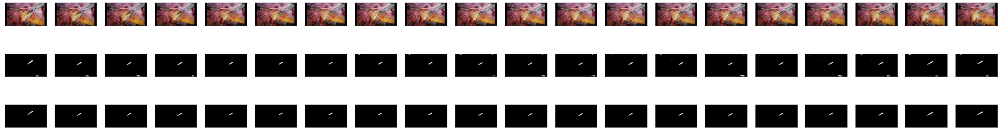

(25, 176, 320)
Label 1:
TP:5771, FP:3947, FN:1286, Precision:0.593846, Recall:0.817770, F-measure:0.688048
Estimation results


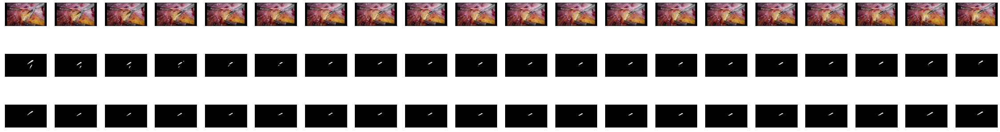

(25, 176, 320)
Label 1:
TP:5507, FP:1710, FN:1550, Precision:0.763059, Recall:0.780360, F-measure:0.771613
Estimation results


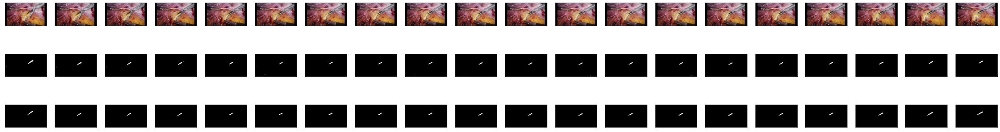

(25, 176, 320)
Label 1:
TP:5486, FP:725, FN:1571, Precision:0.883272, Recall:0.777384, F-measure:0.826952
25 25 25
Estimation results


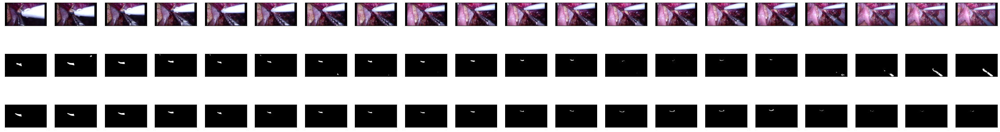

(25, 176, 320)
Label 1:
TP:3573, FP:7362, FN:1071, Precision:0.326749, Recall:0.769380, F-measure:0.458694
Estimation results


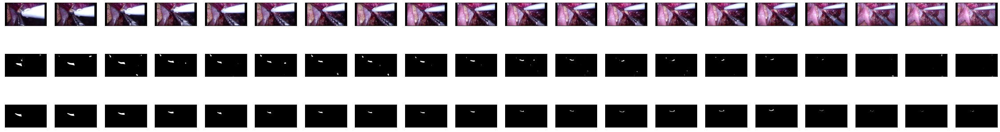

(25, 176, 320)
Label 1:
TP:3936, FP:4532, FN:708, Precision:0.464809, Recall:0.847545, F-measure:0.600366
Estimation results


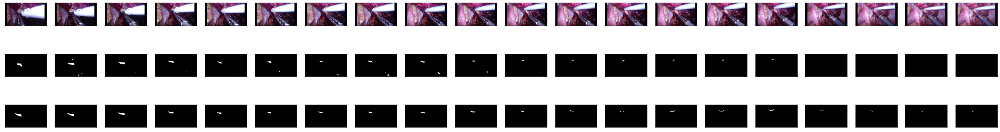

(25, 176, 320)
Label 1:
TP:3252, FP:1720, FN:1392, Precision:0.654063, Recall:0.700258, F-measure:0.676373
Estimation results


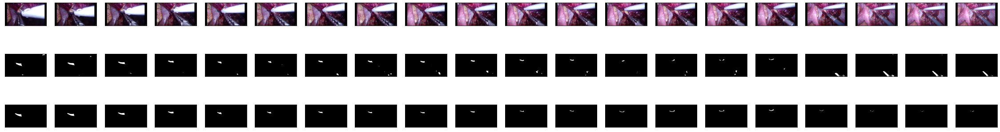

(25, 176, 320)
Label 1:
TP:3723, FP:6763, FN:921, Precision:0.355045, Recall:0.801680, F-measure:0.492135
Estimation results


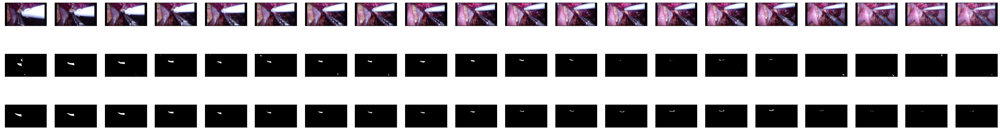

(25, 176, 320)
Label 1:
TP:3414, FP:1624, FN:1230, Precision:0.677650, Recall:0.735142, F-measure:0.705226
Estimation results


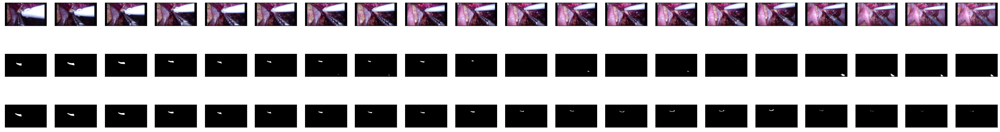

(25, 176, 320)
Label 1:
TP:2881, FP:2244, FN:1763, Precision:0.562146, Recall:0.620370, F-measure:0.589825
25 25 25
Estimation results


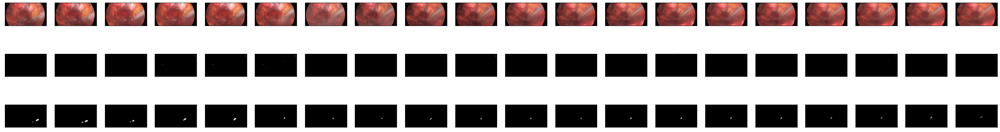

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


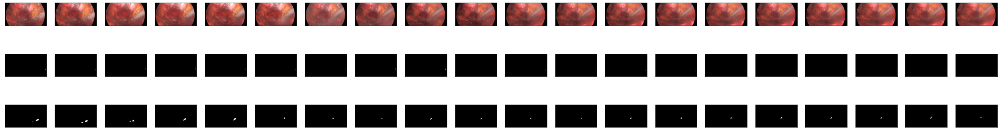

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


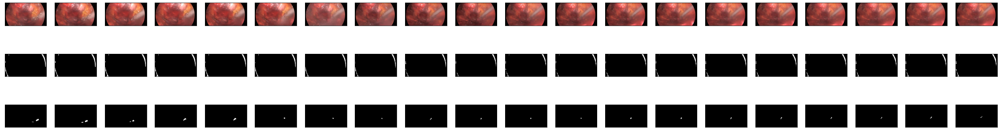

(25, 176, 320)
Label 1:
TP:0, FP:26735, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


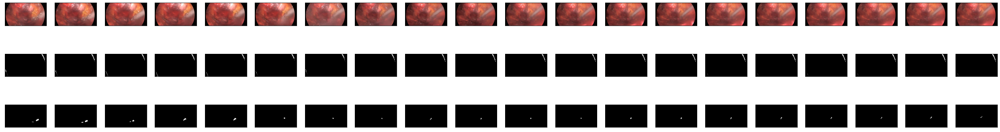

(25, 176, 320)
Label 1:
TP:0, FP:9274, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


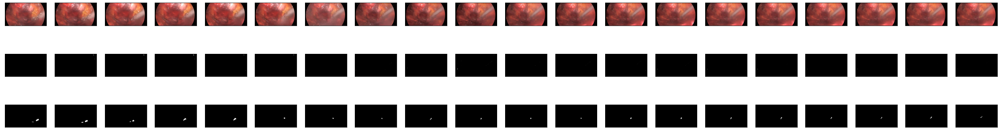

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000
Estimation results


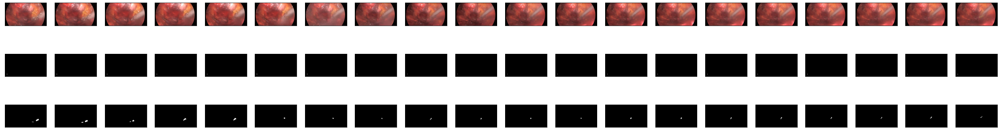

(25, 176, 320)
Label 1:
TP:0, FP:283, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000


In [17]:
import pandas as pd

# モデル読み込み
model_no = [35, 33, 37, 38, 41, 40]
models = []
for no in model_no:
    models.append(load_model(f'./segmentation_model_deeplabv3_{no}.json', f'./segmentation_weight_deeplabv3_{no}.hdf5' ))


# 個々のモデルの推論結果
df2 = pd.DataFrame(columns=check_data_dirs)

for d in check_data_dirs:
    i, l, f = load_test_images(d)
    fmeasures = []
    for m in models:
        r = m.predict(i)
        tp, fp, fn, precision, recall, fmeasure = show_predict_results(r, l, i)
        fmeasures.append(fmeasure)
    df2[d] = fmeasures
        
        
     

25 25 25
JASCAS_ACE_easy
Estimation results


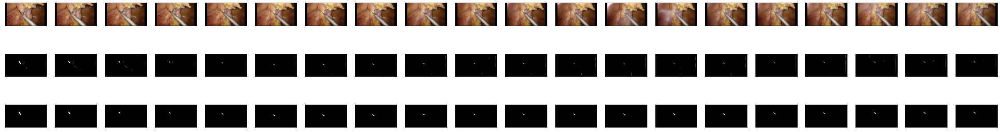

(25, 176, 320)
Label 1:
TP:1164, FP:45, FN:1137, Precision:0.962779, Recall:0.505867, F-measure:0.663248
25 25 25
JASCAS_ACE_middle
Estimation results


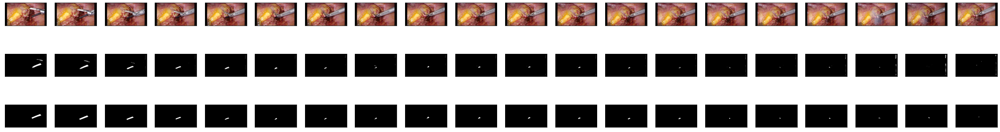

(25, 176, 320)
Label 1:
TP:3436, FP:775, FN:1212, Precision:0.815958, Recall:0.739243, F-measure:0.775708
25 25 25
JASCAS_ACE_hard
Estimation results


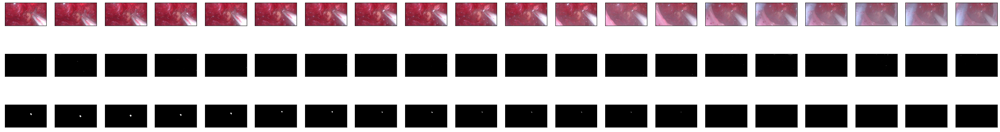

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000
25 25 25
JASCAS_HD_easy
Estimation results


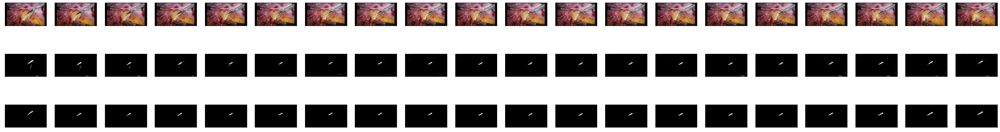

(25, 176, 320)
Label 1:
TP:5556, FP:518, FN:1501, Precision:0.914718, Recall:0.787303, F-measure:0.846242
25 25 25
JASCAS_HD_middle
Estimation results


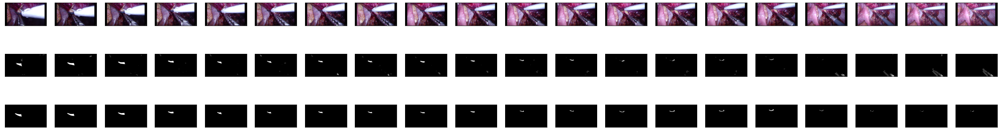

(25, 176, 320)
Label 1:
TP:3621, FP:1045, FN:1023, Precision:0.776039, Recall:0.779716, F-measure:0.777873
25 25 25
JASCAS_HD_hard
Estimation results


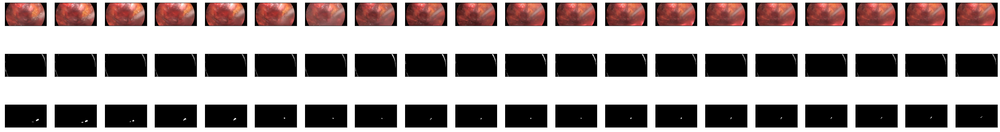

(25, 176, 320)
Label 1:
TP:0, FP:2, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000


,JASCAS_ACE_easy,JASCAS_ACE_middle,JASCAS_ACE_hard,JASCAS_HD_easy,JASCAS_HD_middle,JASCAS_HD_hard
precision,0.962779,0.815958,0.0,0.914718,0.776039,0.0
recall,0.505867,0.739243,0.0,0.787303,0.779716,0.0
F,0.663248,0.775708,0.0,0.846242,0.777873,0.0


In [18]:
# アンサンブル学習の結果
df = pd.DataFrame(index=['precision', 'recall', 'F'])
for d in check_data_dirs:
    i, l, f = load_test_images(d)
    r = ensemble(models[:], [1/6]*6, i)
#     r = ensemble_max([model, model2, model3], i)
    print(d)
    tp, fp, fn, precision, recall, fmeasure = show_predict_results(r, l, i, dirname=d, filenames=f)
    df[d] = [precision, recall, fmeasure]
df



In [13]:
# dataframeを画像として保存
import matplotlib.pyplot as plt

def df2img(df, filename):
    fig, ax = plt.subplots(figsize=(20,3))
    ax.axis('off')
    ax.axis('tight')
    table = ax.table(cellText=df.values,
             colLabels=[x[7:] for x in df.columns],
             rowLabels=df.index,
             loc='center',
             bbox=[0,0,1,1])
    table.auto_set_font_size(False)
    table.set_fontsize(30)
    plt.savefig(filename)

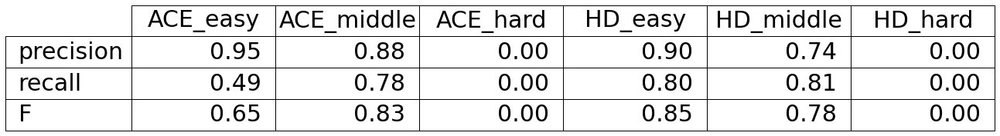

In [92]:
df2img(df.applymap('{:,.2f}'.format), 'table.png')

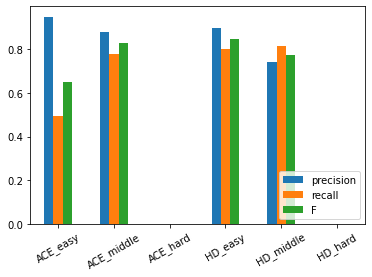

In [47]:
dfdf = df.copy()
dfdf.columns = [x[7:] for x in df.columns]
plot = dfdf.T.plot.bar().legend(loc='lower right')
plt.setp(plot.parent.get_xticklabels(), rotation=30)
plot.get_figure().savefig('bar.png', bbox_inches='tight')

[Text(0, 0, 'ACE_easy'),
 Text(1, 0, 'ACE_middle'),
 Text(2, 0, 'ACE_hard'),
 Text(3, 0, 'HD_easy'),
 Text(4, 0, 'HD_middle'),
 Text(5, 0, 'HD_hard')]

In [41]:
i, l, f = load_test_images('JASCAS_ACE_hard')

r = ensemble(models[1:], [1/3]*3, i)
#     r = ensemble_max([model, model2, model3], i)
print(d)
tp, fp, fn, precision, recall, fmeasure = show_predict_results(r, l, i, dirname='JASCAS_ACE_hard', filenames=f)


25 25 25
different length between models and weights
JASCAS_HD_hard


TypeError: 'NoneType' object is not subscriptable

In [109]:
check_data_dirs

['JASCAS_ACE_easy',
 'JASCAS_ACE_middle',
 'JASCAS_ACE_hard',
 'JASCAS_HD_easy',
 'JASCAS_HD_middle',
 'JASCAS_HD_hard']

<Figure size 432x288 with 0 Axes>

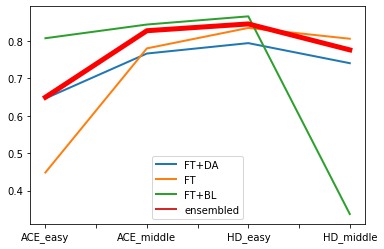

In [63]:
df3 = df2.append(df.loc['F'], ignore_index=True).T
df3 = df3[df3[0] > 0.0]
# df3 = df3.drop(0, axis=1)
df3 = df3.rename(index=lambda s: s[7:]).add_prefix('model_')
# df3 = df3.rename(columns={'model_4': 'ensembled_model'})
df3.columns=['FT+DA', 'FT', 'FT+BL', 'ensembled']
plt.figure()
plot = df3.plot(lw=2)
plot = df3['ensembled'].plot(lw=5, color='red')
plot.get_figure().savefig('compare4.png')
# plt.savefig('data/dst/pandas_iris_line.png')

<Figure size 432x288 with 0 Axes>

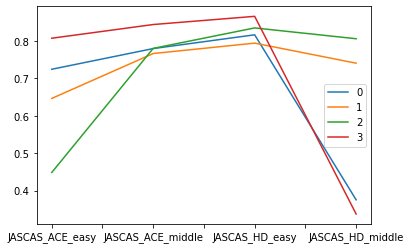

In [55]:
df4 = df2.T
df4 = df4[df4[0] > 0.0]
plt.figure()
plot = df4.plot()
plot.get_figure().savefig('./compare.png')

25 25
1/1 [==============================] - 0s 15ms/step
JASCAS_HD_easy
Estimation results


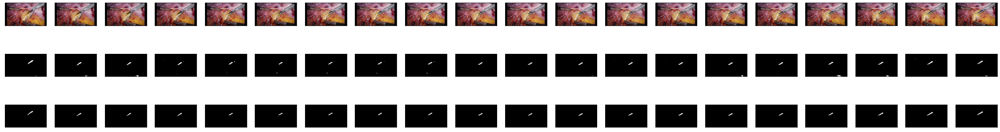

(25, 176, 320)
Label 1:
TP:6251, FP:2003, FN:806, Precision:0.757330, Recall:0.885787, F-measure:0.816537
25 25
1/1 [==============================] - 0s 5ms/step
JASCAS_HD_middle
Estimation results


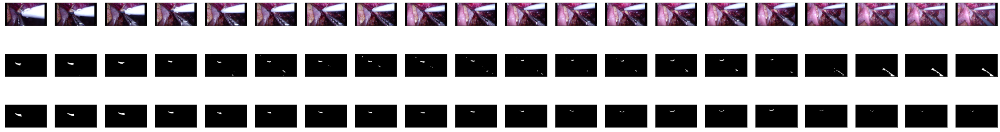

(25, 176, 320)
Label 1:
TP:3259, FP:9458, FN:1385, Precision:0.256271, Recall:0.701766, F-measure:0.375439
25 25
1/1 [==============================] - 0s 4ms/step
JASCAS_HD_hard
Estimation results


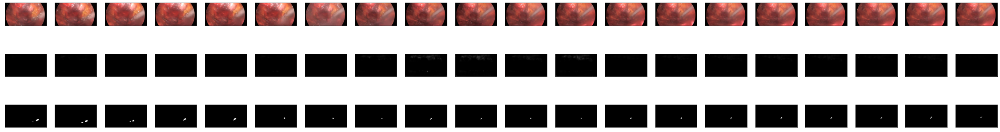

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:2496, Precision:0.000000, Recall:0.000000, F-measure:0.000000


In [129]:
for d in check_data_dirs[3:]:
    i, l, f = load_test_images(d)
    r = model.predict(i, verbose=1)
#     r = ensemble_max([model, model2, model3], i)
    print(d)
    tp, fp, fn, precision, recall, fmeasure = show_predict_results(r, l, i)
    


# hard sampleに対していいモデルを調べる

In [19]:
hard_data_dirs = [d for d in check_data_dirs if 'hard' in d]

In [65]:
'{}aaaa{}'.format(1, 2)

'1aaaa2'

25 25
Estimation results


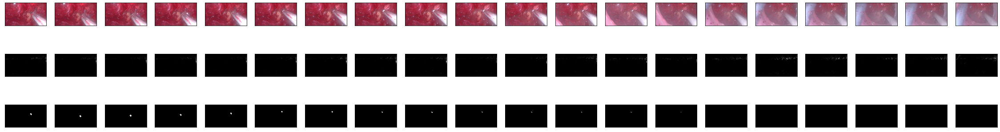

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000


In [90]:
i, l, f = load_test_images(hard_data_dirs[0])
for j in range(29,30):
    model = load_model(
        './segmentation_model_deeplabv3_{}.json'.format(j),
        './segmentation_weight_deeplabv3_{}.hdf5'.format(j))
    
    r = model.predict(i)
    show_predict_results(r, l, i)


# test time augmentation

25 25 25
0.011454299
Estimation results


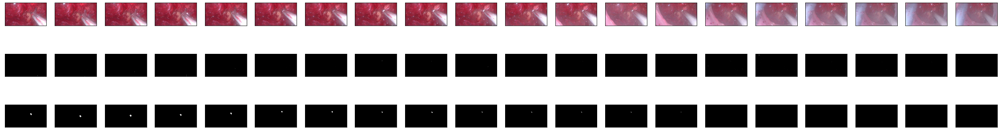

(25, 176, 320)
Label 1:
TP:0, FP:0, FN:983, Precision:0.000000, Recall:0.000000, F-measure:0.000000


(0, 0, 983, 0.0, 0.0, 0)

In [20]:
from keras.models import load_model
from tta_wrapper import tta_segmentation


tta_model = tta_segmentation(model5, h_flip=True,
                             h_shift=(-1, 1), merge='mean')
r_tta = []
i, l, f = load_test_images(hard_data_dirs[0])
for x in i:
    r_tta.append(tta_model.predict(np.expand_dims(x, 0))[0])
# show_predict_results(model5.predict(test_image))
show_predict_results(np.array(r_tta), l, i)